In [1]:
# import seaborn as sns
import shap
shap.initjs()
# import eli5
# from eli5.sklearn import PermutationImportance
# p_id = protein_id[0]
from imblearn.over_sampling import SMOTE
from warnings import filterwarnings
import pandas as pd
import joblib
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from tqdm import tqdm
import numpy as np
import os

[0, 1, 1, 1]

In [10]:
ALL_data = pd.read_csv("./Data/ALL_NP_DATA.csv",index_col=0)
del ALL_data["Title"]
colums_name = ALL_data.columns
R_VS_P = pd.read_csv("R_VS_P.csv",index_col=0)
OS = R_VS_P[R_VS_P["OS_F-ERT_F"]>0]
ERT = R_VS_P[R_VS_P["OS_F-ERT_F"]<=0]

In [18]:
colums_name
colums_name.tolist().index("NP without modification_SiO2")

50

In [3]:
filterwarnings("ignore")

for p_id in list(OS.index):
    model = joblib.load("./ERT_OS_final_Model/" + p_id + "_ERT_best.pkl")
    joblib.dump(model,"./Classification/"+p_id+".pkl")
for p_id in list(ERT.index):
    model = joblib.load("./ERT_final_Model/" + p_id + "_ERT_best.pkl")
    joblib.dump(model,"./Classification/"+p_id+".pkl")

In [15]:
filterwarnings("ignore")
col_name_without_oh = list(colums_name[:13]) +  ["NP without modification","Surface modification","Incubation protein source","NP type","NP shape","Dispersion medium","Incubation culture","Modification type"]
a =  pd.DataFrame(index=col_name_without_oh)
col_name_without_oh = a.index
feature_impotance = pd.DataFrame(columns=col_name_without_oh)

In [8]:
filterwarnings("ignore")
col_name_without_oh = list(colums_name[:13]) +  ["NP without modification","Surface modification","Incubation protein source","NP type","NP shape","Dispersion medium","Incubation culture","Modification type"]
a =  pd.DataFrame(index=col_name_without_oh)
col_name_without_oh = a.index
feature_impotance = pd.DataFrame(columns=col_name_without_oh)
# Feature_Importance = pd.DataFrame(columns=[1,2,3,4,5,6,7,8,9,10])
for p_id in list(OS.index):
    model = joblib.load("./ERT_OS_final_Model/" + p_id + "_ERT_best.pkl")

    feature_important = list(model.feature_importances_)
    feature_important = feature_important[:13]+[sum(feature_important[13:53])]+[sum(feature_important[53:103])]+[sum(feature_important[103:108])]+[sum(feature_important[108:112])]+[sum(feature_important[112:118])]+[sum(feature_important[118:123])]+[sum(feature_important[123:126])]+[sum(feature_important[126:])]
    feature_impotance.loc[p_id] = feature_important
    #     feature_important = pd.DataFrame(feature_important)
#     top10 = feature_important.sort_values(by=[0],ascending=False)[:10].index
#     Feature_Importance.loc[p_id] = col_name_without_oh[top10]
for p_id in list(ERT.index):
    model = joblib.load("./ERT_final_Model/" + p_id + "_ERT_best.pkl")

    feature_important = list(model.feature_importances_)
    feature_important = feature_important[:13]+[sum(feature_important[13:53])]+[sum(feature_important[53:103])]+[sum(feature_important[103:108])]+[sum(feature_important[108:112])]+[sum(feature_important[112:118])]+[sum(feature_important[118:123])]+[sum(feature_important[123:126])]+[sum(feature_important[126:])]
    feature_impotance.loc[p_id] = feature_important
#     feature_important = pd.DataFrame(feature_important)
#     top10 = feature_important.sort_values(by=[0],ascending=False)[:10].index
#     Feature_Importance.loc[p_id] = col_name_without_oh[top10]

In [24]:
p_cor = pd.read_csv("p_correlation_result.csv",index_col=0)

In [25]:
p_cor = pd.DataFrame(p_cor.mean())

In [26]:
p_cor = p_cor.sort_values(by=[0],ascending=False)

In [27]:
p_cor

,0
P02766,0.838815
P07358,0.831887
P07996,0.829821
P07737,0.825990
P05156,0.823708
...,...
Q14624,0.491469
P02768,0.490225
Q9Y490,0.477575
P02675,0.466282


In [290]:
train_shap = joblib.load("Train_shap.pkl")
test_shap = joblib.load("Test_shap.pkl")

In [291]:
P02766_train_shap = train_shap["P02766"]["shap_values"]
P02766_test_shap = test_shap["P02766"]["shap_values"]

In [292]:
p_explainer = joblib.load("protein_explainer.pkl")
P02766_explainer = p_explainer["P02766"]

In [293]:
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)

In [294]:
P02766_train_shap_2 = P02766_explainer(train_X)

In [295]:
P02766_train_shap_2.values.shape

(586, 129, 2)

In [296]:
P02766_train_shap_2.values = np.concatenate([P02766_train_shap_2.values[:,:13,:],np.sum(P02766_train_shap_2.values[:,13:53,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,53:103,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,103:108,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,108:112,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,112:118,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,118:123,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,123:126,:],axis=1).reshape(586,1,2),np.sum(P02766_train_shap_2.values[:,126:,:],axis=1).reshape(586,1,2)],axis = 1)

In [297]:
P02766_train_shap_2.data = np.concatenate([P02766_train_shap_2.data[:,:13],np.sum(P02766_train_shap_2.data[:,13:53],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,53:103],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,103:108],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,108:112],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,112:118],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,118:123],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,123:126],axis=1).reshape(586,1),np.sum(P02766_train_shap_2.data[:,126:],axis=1).reshape(586,1)],axis = 1)

In [298]:
a = col_name_without_oh.tolist()
P02766_train_shap_2.feature_names = a

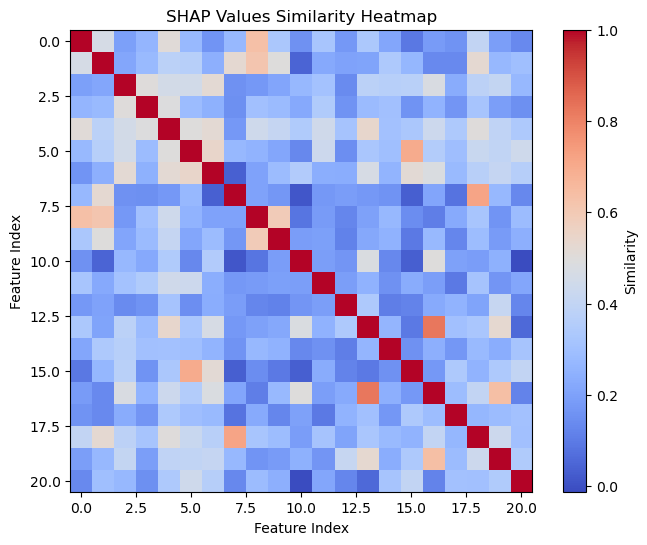

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# 示例 SHAP 值数组（假设为二维数组）
# shap_values = np.random.rand(10, 5)

# 计算 SHAP 值的相似性矩阵
shap_similarity = np.corrcoef(P02766_train_shap_2.values[:,:,1].T)

# 绘制热图
plt.figure(figsize=(8, 6))
plt.imshow(shap_similarity, cmap='coolwarm', interpolation='nearest')
plt.colorbar(label='Similarity')
plt.title('SHAP Values Similarity Heatmap')
plt.xlabel('Feature Index')
plt.ylabel('Feature Index')
plt.show()

In [301]:
shap.force_plot(P02766_explainer.expected_value[1],P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names)

In [302]:
P02766_test_shap_2 = P02766_explainer(test_X)

In [303]:
P02766_test_shap_2.values = np.concatenate([P02766_test_shap_2.values[:,:13,:],np.sum(P02766_test_shap_2.values[:,13:53,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,53:103,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,103:108,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,108:112,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,112:118,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,118:123,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,123:126,:],axis=1).reshape(66,1,2),np.sum(P02766_test_shap_2.values[:,126:,:],axis=1).reshape(66,1,2)],axis = 1)

In [304]:
P02766_test_shap_2.data = np.concatenate([P02766_test_shap_2.data[:,:13],np.sum(P02766_test_shap_2.data[:,13:53],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,53:103],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,103:108],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,108:112],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,112:118],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,118:123],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,123:126],axis=1).reshape(66,1),np.sum(P02766_test_shap_2.data[:,126:],axis=1).reshape(66,1)],axis = 1)

In [305]:
P02766_test_shap_2.feature_names = a

In [306]:
shap.force_plot(P02766_explainer.expected_value[1],P02766_test_shap_2.values[:,:,1],features=P02766_test_shap_2.data,feature_names=P02766_test_shap_2.feature_names)

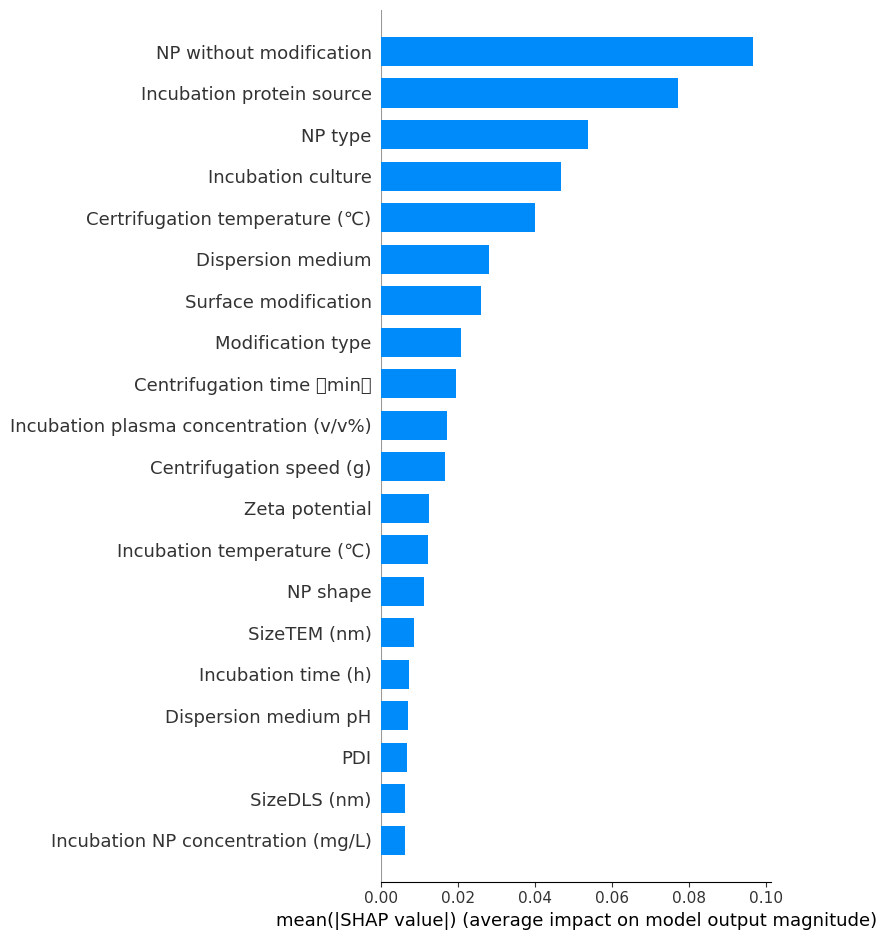

In [52]:
shap.summary_plot(P02766_train_shap_2[:,:,1],plot_type="bar")

In [56]:
b = colums_name.tolist()
b[5] = "Centrifugation time (min)"

In [57]:
P02766_train_shap_2.feature_names = b

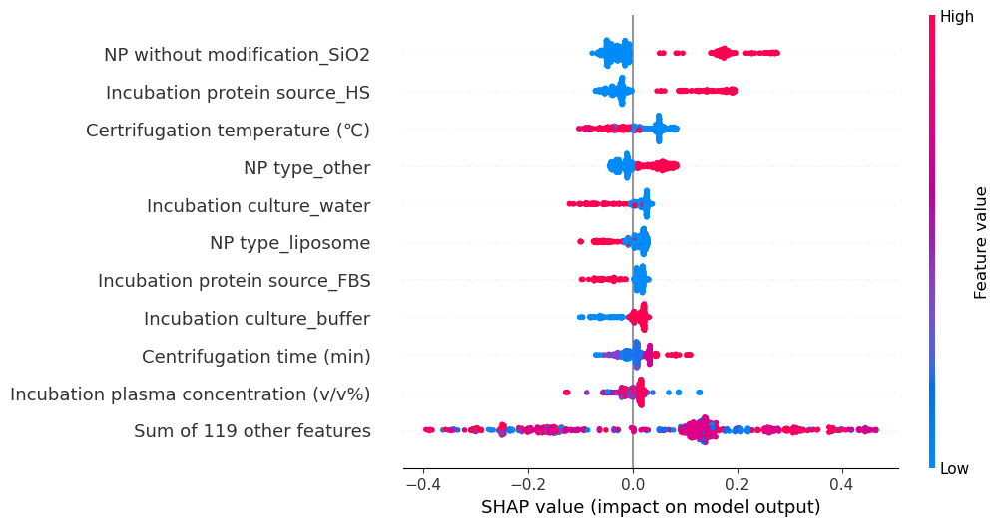

In [82]:
shap.plots.beeswarm(P02766_train_shap_2[:,:,1],max_display=11)

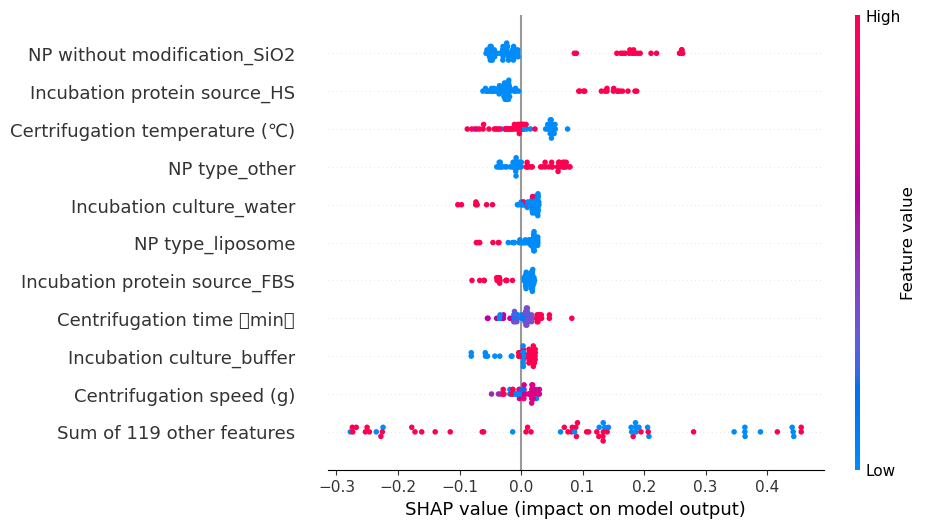

In [66]:
P02766_test_shap_2.feature_names = colums_name.tolist()
shap.plots.beeswarm(P02766_test_shap_2[:,:,1],max_display=11)

In [73]:
b

['SizeTEM (nm)',
 'Zeta potential',
 'Incubation plasma concentration (v/v%)',
 'Incubation NP concentration (mg/L)',
 'Centrifugation speed (g)',
 'Centrifugation time (min)',
 'Certrifugation temperature (℃)',
 'Dispersion medium pH',
 'SizeDLS (nm)',
 'PDI',
 'Incubation time (h)',
 'Incubation temperature (℃)',
 'Centrifugation repetitions',
 'NP without modification_ADM105',
 'NP without modification_ADM70',
 'NP without modification_Ag',
 'NP without modification_Au',
 'NP without modification_Ca3(PO4)2',
 'NP without modification_CaCO3',
 'NP without modification_Chol-DC',
 'NP without modification_Chol-PC',
 'NP without modification_DC-Chol-DOPE',
 'NP without modification_DOPC-DOPE-PEG-DSPC-DPPC',
 'NP without modification_DOPG-DOPA',
 'NP without modification_DOTAP',
 'NP without modification_DOTAP-Chol',
 'NP without modification_DOTAP-Chol-DPPC',
 'NP without modification_DOTAP-Chol-DSPC',
 'NP without modification_DOTAP-Chol-PC',
 'NP without modification_DOTAP-DC-Chol',
 

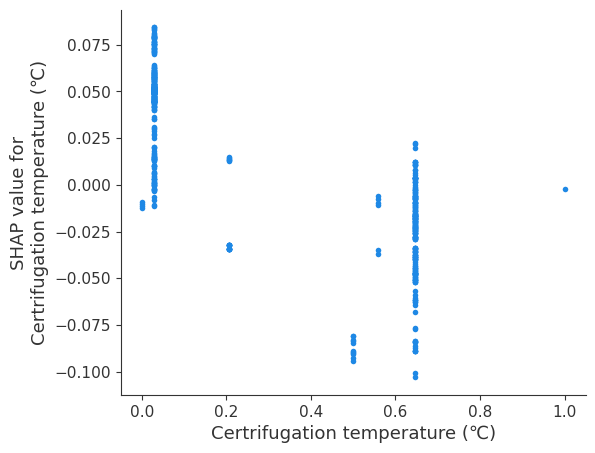

In [43]:
shap.dependence_plot("Certrifugation temperature (℃)",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index=None)

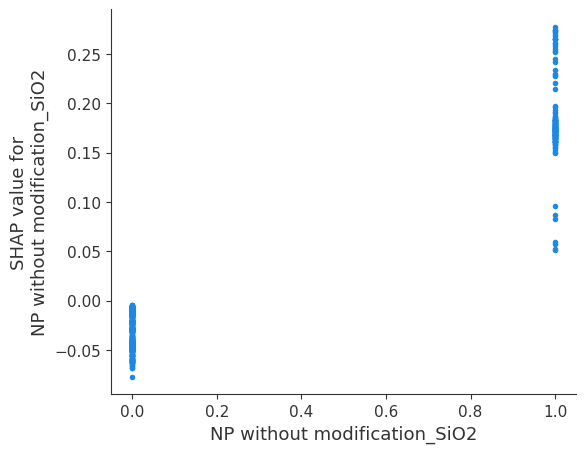

In [72]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index=None)

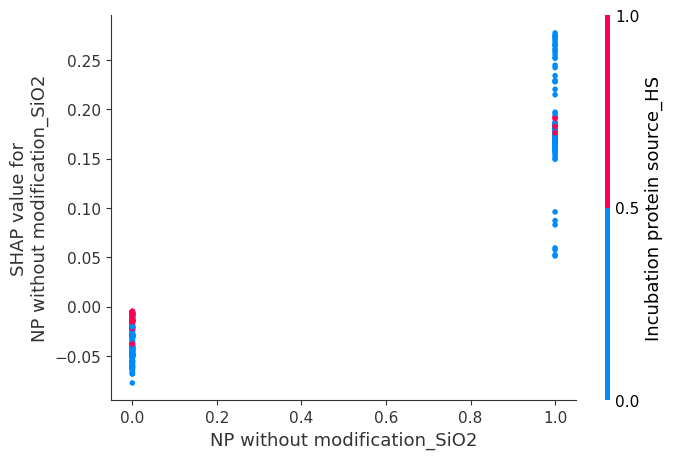

In [74]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Incubation protein source_HS')

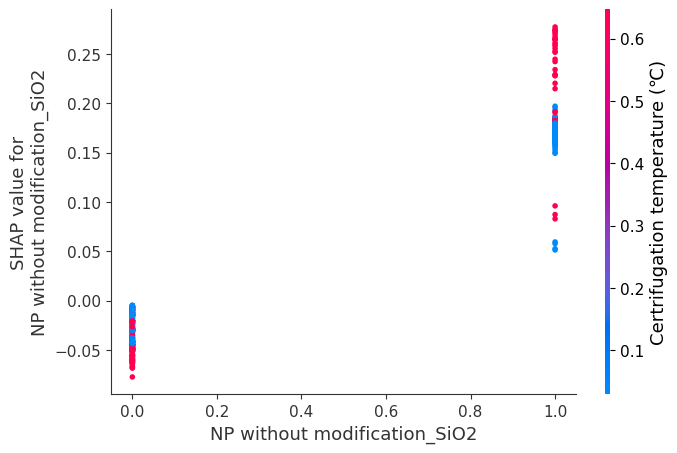

In [75]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Certrifugation temperature (℃)')

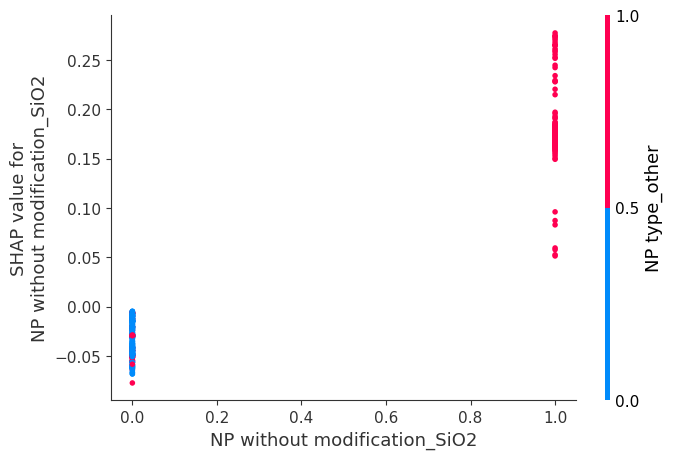

In [76]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='NP type_other')

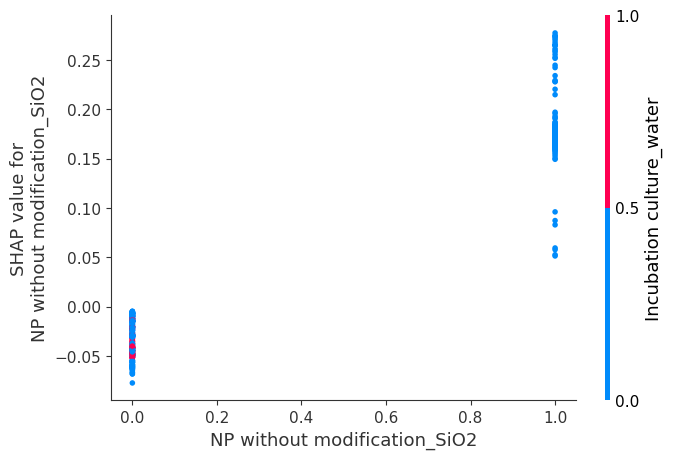

In [77]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Incubation culture_water')

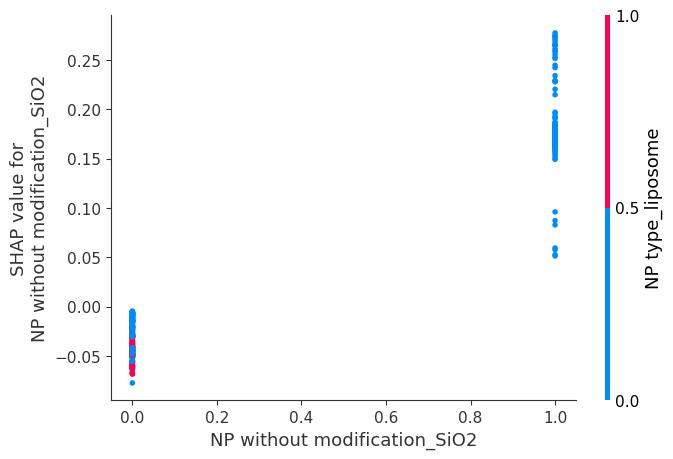

In [78]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='NP type_liposome')

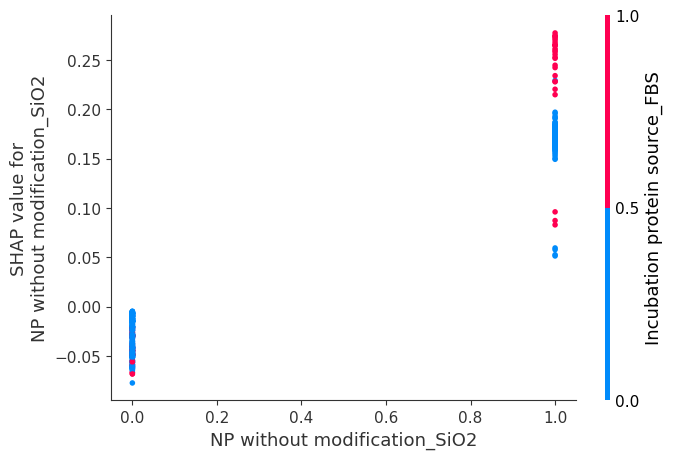

In [79]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Incubation protein source_FBS')

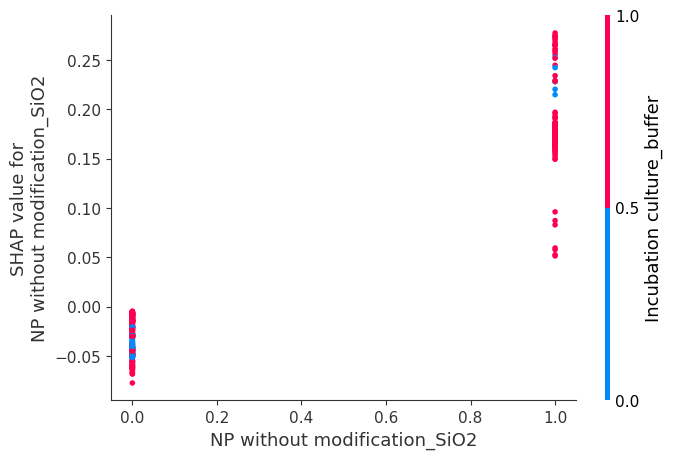

In [80]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Incubation culture_buffer')

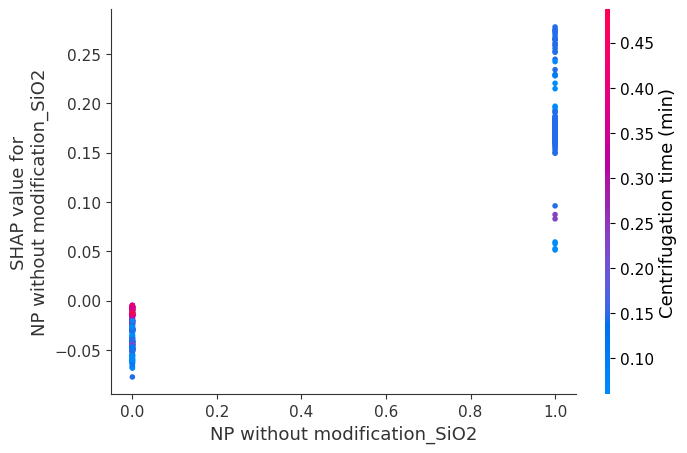

In [81]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Centrifugation time (min)')

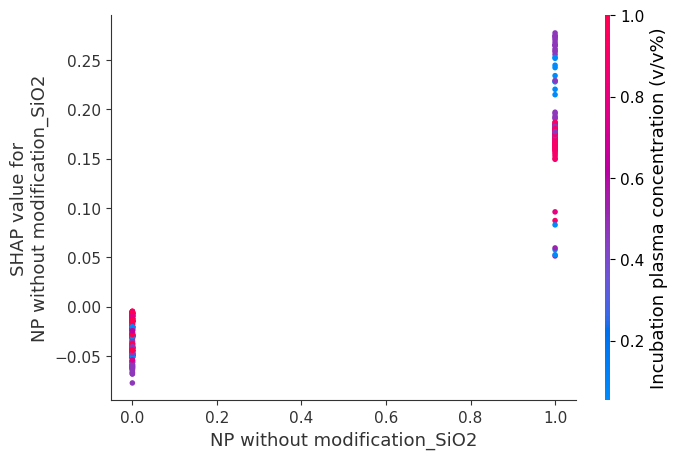

In [83]:
shap.dependence_plot("NP without modification_SiO2",P02766_train_shap_2.values[:,:,1],features=P02766_train_shap_2.data,feature_names=P02766_train_shap_2.feature_names,interaction_index='Incubation plasma concentration (v/v%)')

In [22]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
from torch.autograd import Variable
class DNN(nn.Module):
    def __init__(self,input_size,hidden_size,output_size):
        super(DNN, self).__init__()
        self.linner1 = nn.Linear(input_size,hidden_size)
        self.linner2 = nn.Linear(hidden_size,hidden_size)
        self.linner3 = nn.Linear(hidden_size,output_size)
        self.dropout = nn.Dropout(0.5)
        self.act_fun1 = nn.ReLU()
        self.norm = nn.BatchNorm1d(input_size)
#         self.lstm = nn.LSTM(input_size = input_size,hidden_size=int(hidden_size/2),bidirectional=True)
        self.optimizer = torch.optim.Adam(self.parameters())
        self.sigmoid = nn.Sigmoid()
    def forward(self,X_in):
        X = self.norm(X_in)
#         X,_ = self.lstm(X)
#         X = self.dropout(X)
#         X = self.act_fun1(X)
        X = self.linner1(X)
#         X = self.dropout(X)
#         X = self.act_fun1(X)
#         X = self.linner2(X)
        X = self.dropout(X)
        X = self.act_fun1(X)
        X = self.linner3(X)
        X_out = self.sigmoid(X)
#         X_out = X_out.unsqueeze(-1)
        return X_out

In [179]:
class ProDataset(Dataset):
    def __init__(self,Dataframe_X,Dataframe_Y,Protein_Feature=None,p_id=None):
        self.X = Dataframe_X.values
        self.Y = Dataframe_Y.values
        # self.P_feature = Protein_Feature.loc[p_id].values,
    def __getitem__(self, index):
        label = self.Y[index]
        X = self.X[index]
        # X = np.concatenate([X,self.P_feature.T],axis=0),
        X = torch.tensor(X).float()
        label = torch.tensor(label).long()
        return X,label

    def __len__(self):
        return len(self.Y)

In [162]:
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
train_y.index = [i for i in range(len(train_y))]
test_y.index = [i for i in range(len(test_y))]
train_y = pd.DataFrame(train_y)
test_y = pd.DataFrame(test_y)
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
# test_X = torch.tensor(test_X).float()
# train_X = torch.tensor(train_X).float()

In [163]:
Full_train_loader = DataLoader(dataset=ProDataset(train_X,train_y),batch_size=32,shuffle=True)

In [164]:
loss_func = nn.CrossEntropyLoss(reduction="mean")
def train_one_epoch(model,dataloader):
    epoch_loss_train = 0
    n = 0
    for i,(NP_Feature,target) in enumerate(dataloader):
        batch_size = NP_Feature.size(0)
        NP_Feature = Variable(NP_Feature.float())
        # cos_target = Variable(cos_target.cuda())
        target = torch.squeeze(target)
        target = Variable(target)

        target = torch.tensor(target, dtype=torch.int64)
        # cos_target = torch.tensor(cos_target, dtype=torch.int64)
        # if model.constrative:
        #     output,feature_map,feature_map_noise = model(input)
        #     output = output.squeeze()
        #     _loss = model.loss_func(output, target)
        #     criterion = Cal_Contrastive_loss(batch_size,0.1,1)
        #     cl_loss = 0.05 * criterion(feature_map,feature_map_noise)
        #     loss = _loss + cl_loss
        # else:
        output = model(NP_Feature)
        output = output.squeeze()
        # cos_loss = cosine_loss(np_embedding,protein_embddeing,cos_target)

        loss = loss_func(output,target)
        # loss = cos_loss+out_loss
        # epoch_loss_train += loss.cpu().detach().numpy()
        epoch_loss_train += loss
        model.optimizer.zero_grad()
        loss.backward()
        model.optimizer.step()
        n += 1
    epoch_loss_train_avg = epoch_loss_train/n
    return epoch_loss_train_avg

def evalute(model,dataloader):
    model.eval()
    epoch_loss = 0.0
    n =0
    pred = []
    true_=[]
    for data in dataloader:
        with torch.no_grad():
            NP_Feature,target= data
            NP_Feature = Variable(NP_Feature.float())

            # Protein_Feature = Variable(Protein_Feature.cuda().float())
            target = Variable(target)
            # cos_target = Variable(cos_target.cuda())
            target = torch.squeeze(target)
            target = torch.tensor(target, dtype=torch.int64)
            # cos_target = torch.tensor(cos_target,dtype=torch.int64)
            # target_label = target.cpu().detach().numpy()
            target_label = target
            output = model(NP_Feature)
            output = output.squeeze()
            # cos_loss = cosine_loss(np_embedding,protein_embedding,cos_target)
            loss = loss_func(output,target)
            # loss = cos_loss + out_loss
            # epoch_loss += loss.cpu().detach().numpy()
            epoch_loss += loss
            soft = nn.Softmax(dim=1)
            # y_pred = output
            y_pred = soft(output)
            # y_pred = y_pred.cpu().detach().numpy()
            pred += [pred[1] for pred in y_pred]
            # pred += [pred_ for pred_ in y_pred]
            true_ += list(target_label)
            n += 1
    epoch_loss_avg = epoch_loss/n
    return epoch_loss_avg,pred,true_

def analysis(y_true,y_pred,best_threshold = 0.5):
    if best_threshold == None:
        best_threshold =0
        best_f1 = 0
        for threshold in range(0,100):
            threshold = threshold/100
            binary_pred = [1 if pred >= threshold else 0 for pred in y_pred ]
            binary_true = y_true
            f1 = metrics.f1_score(binary_true,binary_pred)
            if f1 > best_f1:
                best_f1 = f1
                best_threshold = threshold
    binary_pred = [1 if pred >= best_threshold else 0 for pred in y_pred]
    binary_true = y_true

    binary_acc = metrics.accuracy_score(binary_true, binary_pred)
    precision = metrics.precision_score(binary_true, binary_pred)
    recall = metrics.recall_score(binary_true, binary_pred)
    f1 = metrics.f1_score(binary_true, binary_pred)
    AUC = metrics.roc_auc_score(binary_true, y_pred)
    precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
    AUPRC = metrics.auc(recalls, precisions)
    mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
    results = {
        'binary_acc': binary_acc,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'AUC': AUC,
        'AUPRC': AUPRC,
        'mcc': mcc,
        'threshold': best_threshold
    }

    return results
def regressor_analysis(y_true,y_pred):

    r2 = metrics.r2_score(y_true,y_pred)
    rmse  = sqrt(mean_squared_error(y_true,y_pred))
    # binary_acc = metrics.accuracy_score(binary_true, binary_pred)
    # precision = metrics.precision_score(binary_true, binary_pred)
    # recall = metrics.recall_score(binary_true, binary_pred)
    # f1 = metrics.f1_score(binary_true, binary_pred)
    # AUC = metrics.roc_auc_score(binary_true, y_pred)
    # precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
    # AUPRC = metrics.auc(recalls, precisions)
    # mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
    results = {
        'r2': r2,
        'rmse': rmse,
    }

    return results

def analysis_test(y_true,y_pred,best_threshold = None):
    best_f1 = 0
    best_acc = 0
    best_recall = 0
    best_precision = 0
    best_AUC = 0
    best_mcc = 0
    if best_threshold == None:
        best_threshold = 0
        threshold_ = pd.DataFrame(columns=["acc", "precision","recall","f1","AUC","AUPRC","mcc"])
        for threshold in range(0, 100):
            threshold = threshold / 100
            binary_pred = [1 if pred >= threshold else 0 for pred in y_pred]
            binary_true = y_true
            binary_acc = metrics.accuracy_score(binary_true, binary_pred)
            precision = metrics.precision_score(binary_true, binary_pred)
            recall = metrics.recall_score(binary_true, binary_pred)
            f1 = metrics.f1_score(binary_true, binary_pred)
            AUC = metrics.roc_auc_score(binary_true, y_pred)
            precisions, recalls, thresholds = metrics.precision_recall_curve(binary_true, y_pred)
            AUPRC = metrics.auc(recalls, precisions)
            mcc = metrics.matthews_corrcoef(binary_true, binary_pred)
            threshold_.loc[threshold] = [binary_acc,precision,recall,f1,AUC,AUPRC,mcc]
            if f1 > best_f1:
                best_acc = binary_acc
                best_recall = recall
                best_f1 = f1
                best_precision = precision
                best_threshold = threshold
                best_AUC = AUC
                best_mcc = mcc

        # threshold_.to_csv(\./DNN_Model_results/{}_about_threshold.csv\.format(modelname))
    binary_pred = [1 if pred >= best_threshold else 0 for pred in y_pred]
    binary_true = y_true
    # final_acc = metrics.accuracy_score(binary_true, binary_pred)
    # final_recall = metrics.recall_score(binary_true, binary_pred)
    # avg_metrics = float(final_acc + final_recall) / 2

    return best_f1, best_acc,best_recall,best_precision,best_AUC,best_mcc,best_threshold,binary_pred,binary_true


In [10]:
from warnings import filterwarnings
from imblearn.over_sampling import SMOTE
from sklearn import metrics
filterwarnings("ignore")
SEED = 2024
np.random.seed(SEED)
torch.manual_seed(SEED)
metrics_train = pd.DataFrame(columns=["train_loss","AUROC","Recall","Precision","F1","MCC","ACC"])
metrics_test = pd.DataFrame(columns=["AUROC","Recall","Precision","F1","MCC","ACC"])
# metrics_test = pd.DataFrame(columns=["rmse","r2"])
ALL_RPA = pd.read_csv("./Data/PROTEIN_RPA.csv",index_col=0)
protein_id = ALL_RPA.columns
for p_id in tqdm(protein_id):
    train_data = pd.read_csv("./Protein_data/" + p_id + "_Train_data.csv",index_col=0)
    test_data = pd.read_csv("./Protein_data/" + p_id + "_Test_data.csv",index_col=0)
    del train_data["Title"]
    del test_data["Title"]
    Train_X = train_data.iloc[:,:-1]
    Train_y = train_data.iloc[:,-1]
    Test_X = test_data.iloc[:,:-1]
    Test_y = test_data.iloc[:,-1]
    Train_y.index = [i for i in range(len(Train_y))]
    Test_y.index = [i for i in range(len(Test_y))]
    Train_y = pd.DataFrame(Train_y)
    Test_y = pd.DataFrame(Test_y)
    scaler = MinMaxScaler()
    scaler.fit(Train_X)
    Train_X = scaler.transform(Train_X)
    Train_X = pd.DataFrame(Train_X)
    smote = SMOTE(random_state=1412)
    train_X_new,train_y_new = smote.fit_resample(Train_X,Train_y)
    # train_pca = PCA(n_components=54,random_state=1412)
    # dim_reduce_X = train_pca.fit_transform(Train_X,Train_y)
    # P_feature = Protein_F.loc[p_id]
    # new_feature = dim_reduce_X @ P_feature
    # new_feature = pd.DataFrame(new_feature)
    # Train_X = pd.concat([Train_X,new_feature],axis=1)
    # protein_f = pd.DataFrame(Protein_Feature.loc[p_id]).T
    # protein_train = pd.DataFrame()
    # for i in range(len(Train_X)):
    #     protein_train = pd.concat([protein_train,protein_f],axis=0)
    # protein_train.index = [i for i in range(len(protein_train))]
    # Train_X = pd.concat([Train_X,protein_train],axis=1)
    Test_X = scaler.transform(Test_X)
    Test_X = pd.DataFrame(Test_X)
    # dim_reduce_X_test = train_pca.transform(Test_X)
    # new_feature_test = dim_reduce_X_test @ P_feature
    # new_feature_test = pd.DataFrame(new_feature_test)
    # Test_X = pd.concat([Test_X,new_feature_test],axis=1)
    # protein_test = pd.DataFrame()
    # for j in range(len(Test_X)):
    #     protein_test = pd.concat([protein_test,protein_f],axis=0)
    # protein_test.index = [i for i in range(len(protein_test))]
    # Test_X = pd.concat([Test_X,protein_test],axis=1)
    # cv = KFold(n_splits=5,shuffle=True,random_state=1412)
    # fold = 0
    # f1_score = 0
    # acc = 0
    # recall = 0
    # precision = 0
    # AUC = 0
    # MCC = 0
    # r2 = 0
    # rmse = 0
    # for train,valid in cv.split(Train_X,Train_y):
    #     x_,X_valid = Train_X.iloc[train,:],Train_X.iloc[valid,:]
    #     y_,Y_valid = Train_y.iloc[train,:],Train_y.iloc[valid,:]
    #     Model = DNN(129,256,2)
    #     train_loader = DataLoader(dataset=ProDataset(x_,y_),batch_size=32,shuffle=True)
    #     valid_loader = DataLoader(dataset=ProDataset(X_valid,Y_valid),batch_size=32,shuffle=True)
    #     test_loader = DataLoader(dataset=ProDataset(Test_X,Test_y),batch_size=32,shuffle=True)
    #
    #     for epoch in range(30):
    #         Model.train()
    #         epoch_train_loss_avg = train_one_epoch(Model,train_loader)
    #         # epoch_train_loss,train_pred,train_true = evalute(Model,train_loader)
    #         # train_result = analysis(train_true,train_pred)
    #         # epoch_val_loss,val_pred,val_true = evalute(Model,valid_loader)
    #         # result_valid = analysis(val_true,val_pred)
    #         epoch_test_loss, test_pred, test_true = evalute(Model, test_loader)
    #         modelname_ = p_id + '_Fold' + str(fold) + '_' + str(epoch + 1)
    #         best_f1, best_acc,best_recall,best_precision,best_AUC,best_mcc,best_threshold =  analysis_test(test_true, test_pred)
    #
    #         if best_f1 > f1_score :
    #             # best_epoch = epoch+1
    #             # best_test_avg = test_avg_metrics
    #             f1_score = best_f1
    #             acc = best_acc
    #             recall = best_recall
    #             precision = best_precision
    #             AUC = best_AUC
    #             MCC = best_mcc
    #             # recall = best_recall
    #             # acc = best_acc
    #             # r2 = result_test["r2"]
    #             # rmse = result_test["rmse"]
    #
    #
    #             torch.save(Model.state_dict(), os.path.join("./DNN_Model",p_id + '_DNN_best.pkl'))
    #     # print(\{}_best_F1_SCORE:{}\.format(p_id,fold,f1_score))
    #     fold += 1
    Full_train_loader = DataLoader(dataset=ProDataset(train_X_new,train_y_new),batch_size=32,shuffle=True)
    Full_test_loader = DataLoader(dataset=ProDataset(Test_X,Test_y),batch_size=32,shuffle=True)
    Full_Model = DNN(129,256,2)
    # Full_f1_score = 0
    # Full_acc = 0
    # Full_recall = 0
    # Full_precision = 0
    # Full_AUC = 0
    # Full_MCC = 0
    # Full_r2 = 0
    # Full_rmse = 0
    for epoch_ in range(200):
            Full_Model.train()
            epoch_train_loss_avg = train_one_epoch(Full_Model,Full_train_loader)
#             epoch_train_loss,train_pred,train_true = evalute(Full_Model,Full_train_loader)
#             train_result = analysis(train_true,train_pred)
#             metrics_train.loc[epoch_] = [epoch_train_loss,train_result["AUC"],train_result["recall"],train_result["precision"],train_result["f1"],train_result["mcc"],train_result["binary_acc"]]
#     metrics_train.to_csv("./DNN_train_OS_results/"+p_id+"_train.csv")
            #

    epoch_test_loss, test_pred, test_true = evalute(Full_Model, Full_test_loader)
    # modelname_ = 'Fold' + str(fold) + '_' + str(epoch_ + 1)
    test_result= analysis(test_true, test_pred)
    metrics_test.loc[p_id]=[test_result["AUC"],test_result["recall"],test_result["precision"],test_result["f1"],test_result["mcc"],test_result["binary_acc"]]

    # if full_best_f1 > Full_f1_score :
    #     # best_epoch = epoch+1
    #     # best_test_avg = test_avg_metrics
    #     Full_f1_score = full_best_f1
    #     Full_acc = full_best_acc
    #     Full_recall = full_best_recall
    #     Full_precision = full_best_precision
    #     Full_AUC = full_best_AUC
    #     Full_MCC = full_best_mcc
    #     # recall = best_recall
    #     # acc = best_acc
    #     # Full_r2 = full_result_test["r2"]
    #     # Full_rmse = full_result_test["rmse"]
    #     if Full_f1_score > f1_score:
    torch.save(Full_Model.state_dict(), os.path.join("./DNN_OS_50_final_Model",p_id + '_DNN_best.pkl'))

    # if Full_f1_score > f1_score:
    #     metrics_test.loc[p_id] = [Full_AUC,Full_recall,Full_precision,Full_f1_score,Full_MCC,Full_acc]
    #     # metrics_test.loc[p_id] = [Full_rmse,Full_r2]
    #     # print(\{}_best_R2:{}\.format(p_id,Full_r2))
    # else:
    #     metrics_test.loc[p_id] = [AUC,recall,precision,f1_score,MCC,acc]
        # metrics_test.loc[p_id] = [rmse,r2]
        # print(\{}_best_R2:{}\.format(p_id,r2))

metrics_test.to_csv("./Model_results/DNN_OS_50_test_results.csv")

100%|██████████| 178/178 [09:54<00:00,  3.34s/it]


In [308]:
Full_Model = DNN(129,256,2)
    # model = joblib.load("./ERT_Model/"+p_id+"_ERT_best.pkl")
Full_Model.load_state_dict(torch.load("./DNN_OS_50_final_Model/P02766_DNN_best.pkl"))

RuntimeError: Error(s) in loading state_dict for DNN:
	size mismatch for linner3.weight: copying a param with shape torch.Size([1, 256]) from checkpoint, the shape in current model is torch.Size([2, 256]).
	size mismatch for linner3.bias: copying a param with shape torch.Size([1]) from checkpoint, the shape in current model is torch.Size([2]).

In [231]:
from sklearn import metrics
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
Train_X = train_data.iloc[:,:-1]
Train_y = train_data.iloc[:,-1]
Test_X = test_data.iloc[:,:-1]
Test_y = test_data.iloc[:,-1]
Train_y.index = [i for i in range(len(Train_y))]
Test_y.index = [i for i in range(len(Test_y))]
Train_y = pd.DataFrame(Train_y)
Test_y = pd.DataFrame(Test_y)
scaler = MinMaxScaler()
scaler.fit(Train_X)
Train_X = scaler.transform(Train_X)
Train_X = pd.DataFrame(Train_X)
smote = SMOTE(random_state=1412)
train_X_new,train_y_new = smote.fit_resample(Train_X,Train_y)

Test_X = scaler.transform(Test_X)
Test_X = pd.DataFrame(Test_X)

Full_train_loader = DataLoader(dataset=ProDataset(train_X_new,train_y_new),batch_size=32,shuffle=True)
Full_test_loader = DataLoader(dataset=ProDataset(Test_X,Test_y),batch_size=32,shuffle=True)
Full_Model = DNN(129,256,2)

for epoch_ in tqdm(range(50)):
        Full_Model.train()
        epoch_train_loss_avg = train_one_epoch(Full_Model,Full_train_loader)
#             epoch_train_loss,train_pred,train_true = evalute(Full_Model,Full_train_loader)
#             train_result = analysis(train_true,train_pred)
#             metrics_train.loc[epoch_] = [epoch_train_loss,train_result["AUC"],train_result["recall"],train_result["precision"],train_result["f1"],train_result["mcc"],train_result["binary_acc"]]
#     metrics_train.to_csv("./DNN_train_OS_results/"+p_id+"_train.csv")
        #

epoch_test_loss, test_pred, test_true = evalute(Full_Model, Full_test_loader)
# modelname_ = 'Fold' + str(fold) + '_' + str(epoch_ + 1)
test_result= analysis(test_true, test_pred)
# metrics_test.loc[p_id]=[test_result["AUC"],test_result["recall"],test_result["precision"],test_result["f1"],test_result["mcc"],test_result["binary_acc"]]


torch.save(Full_Model.state_dict(), os.path.join("./DNN_test_Model/P02766_DNN_lstm_best.pkl"))


100%|██████████| 50/50 [00:01<00:00, 32.64it/s]


In [232]:
print(test_result["AUC"],test_result["recall"],test_result["precision"],test_result["f1"],test_result["mcc"],test_result["binary_acc"])

0.8605371900826446 0.9090909090909091 0.851063829787234 0.8791208791208791 0.6152230815643913 0.8333333333333334


In [23]:
Full_Model = DNN(129,256,1)
    # model = joblib.load("./ERT_Model/"+p_id+"_ERT_best.pkl")
Full_Model.load_state_dict(torch.load("./DNN_OS_50_final_Model/P02766_DNN_best.pkl"))

<All keys matched successfully>

In [311]:
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
train_y.index = [i for i in range(len(train_y))]
test_y.index = [i for i in range(len(test_y))]
train_y = pd.DataFrame(train_y)
test_y = pd.DataFrame(test_y)
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
test_X = torch.tensor(test_X).float()
train_X = torch.tensor(train_X).float()

In [314]:
# for data in Full_train_loader:
#     NP_Feature,target= data
#     NP_Feature = Variable(NP_Feature.float())

#         # Protein_Feature = Variable(Protein_Feature.cuda().float())
#         target = Variable(target)
#         # cos_target = Variable(cos_target.cuda())
#         target = torch.squeeze(target)
#         target = torch.tensor(target, dtype=torch.int64)
#         # cos_target = torch.tensor(cos_target,dtype=torch.int64)
#         # target_label = target.cpu().detach().numpy()
#         target_label = target
train_X = np.array(train_X)
train_X = torch.tensor(train_X).float()
dnn_explainer = shap.DeepExplainer(Full_Model,train_X)
dnn_shap,a = dnn_explainer.shap_values(train_X)
train_X = train_X.numpy()
dnn_shap_analysis = shap.Explanation(values=dnn_shap,data = train_X,feature_names=colums_name.tolist())
# dnn_explainer = shap.DeepExplainer(Full_Model,test_X)
# dnn_shap,a = dnn_explainer.shap_values(test_X)
# test_X = test_X.numpy()
# dnn_shap_analysis = shap.Explanation(values=dnn_shap,data = test_X,feature_names=colums_name.tolist())
#         output = output.squeeze()
#         # cos_loss = cosine_loss(np_embedding,protein_embedding,cos_target)
#         loss = loss_func(output,target)
        # loss = cos_loss + out_loss
        # epoch_loss += loss.cpu().detach().numpy()
#         epoch_loss += loss
#         soft = nn.Softmax(dim=1)
        # y_pred = output
#         y_pred = soft(output)
        # y_pred = y_pred.cpu().detach().numpy()
#         pred += [pred[1] for pred in y_pred]
        # pred += [pred_ for pred_ in y_pred]
#         true_ += list(target_label)
#         n += 1

In [273]:
dnn_shap[:,50,1].shape

(66,)

In [289]:
np_sio2 = pd.DataFrame(np.concatenate([P02766_test_shap_2.values[:,6,1].reshape(66,1),dnn_shap[:,6,1].reshape(66,1)],axis =1),columns=["ERT_NP","DNN_NP"])
np_sio2.to_csv("CT_test_p_values.csv")

In [313]:
dnn_shap_analysis.values = np.concatenate([dnn_shap_analysis.values[:,:13,:],np.sum(dnn_shap_analysis.values[:,13:53,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,53:103,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,103:108,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,108:112,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,112:118,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,118:123,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,123:126,:],axis=1).reshape(586,1,2),np.sum(dnn_shap_analysis.values[:,126:,:],axis=1).reshape(586,1,2)],axis = 1)

ValueError: cannot reshape array of size 66 into shape (586,1,2)

In [141]:
dnn_shap_analysis.values = np.concatenate([dnn_shap_analysis.values[:,:13,:],np.sum(dnn_shap_analysis.values[:,13:53,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,53:103,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,103:108,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,108:112,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,112:118,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,118:123,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,123:126,:],axis=1).reshape(66,1,2),np.sum(dnn_shap_analysis.values[:,126:,:],axis=1).reshape(66,1,2)],axis = 1)

In [152]:
import numpy as np
import matplotlib.pyplot as plt

# 示例 SHAP 值数组（假设为二维数组）
# shap_values = np.random.rand(10, 5)

# 计算 SHAP 值的相似性矩阵
ert_shap_ = P02766_test_shap_2.values[:,:,1]
dnn_shap_ = dnn_shap_analysis.values[:,:,1]
s_ = []
for i in range(21):

    shap_similarity = np.corrcoef([ert_shap_[:,i],
                                   dnn_shap_[:,i]])
    s_.append(shap_similarity[0,1])

# 绘制热图
s_

[0.7297601617039646,
 0.6824552689901943,
 0.22931811679007053,
 -0.4262371120801406,
 0.3614609395825745,
 0.5957530390647396,
 0.8461372712051666,
 -0.055913478772737335,
 -0.5148491512310027,
 0.23669943882851963,
 0.7650689192748014,
 0.7385216240816415,
 0.9339264854124898,
 0.14296030286149183,
 0.13250842017536393,
 0.08876010770278875,
 0.392773308189768,
 0.097417717292578,
 0.017576145841616753,
 0.019895007120444775,
 0.18197288265609238]

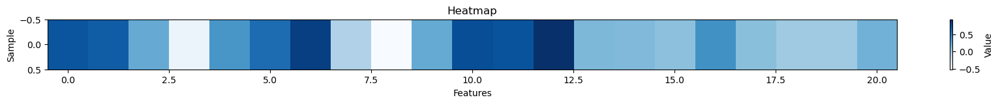

In [159]:
data = np.array(s_).reshape(1, -1)

# 绘制热图
plt.figure(figsize=(21, 1))
plt.imshow(data, cmap='Blues', aspect='auto')
plt.colorbar(label='Value')
plt.title('Heatmap')
plt.xlabel('Features')
plt.ylabel('Sample')
plt.show()


In [248]:
shap.force_plot(dnn_explainer.expected_value[1],dnn_shap_analysis.values[:,:,1],features=dnn_shap_analysis.data,feature_names=dnn_shap_analysis.feature_names)

In [10]:
shap.force_plot(dnn_explainer.expected_value[1],dnn_shap_analysis.values[:,:,1],features=dnn_shap_analysis.data,feature_names=dnn_shap_analysis.feature_names)

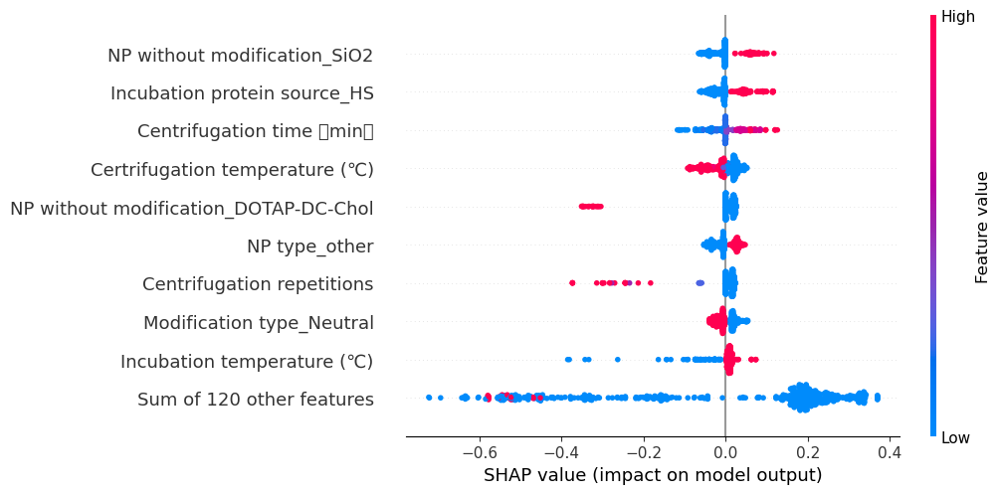

In [111]:
shap.plots.beeswarm(dnn_shap_analysis[:,:,1])

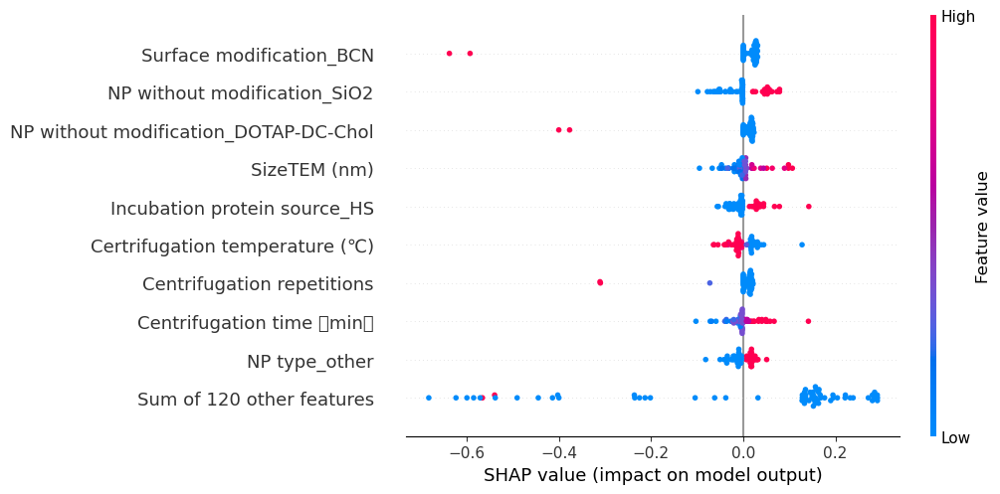

In [10]:
shap.plots.beeswarm(dnn_shap_analysis[:,:,1])

In [44]:
colums_name.tolist()

['SizeTEM (nm)',
 'Zeta potential',
 'Incubation plasma concentration (v/v%)',
 'Incubation NP concentration (mg/L)',
 'Centrifugation speed (g)',
 'Centrifugation time （min）',
 'Certrifugation temperature (℃)',
 'Dispersion medium pH',
 'SizeDLS (nm)',
 'PDI',
 'Incubation time (h)',
 'Incubation temperature (℃)',
 'Centrifugation repetitions',
 'NP without modification_ADM105',
 'NP without modification_ADM70',
 'NP without modification_Ag',
 'NP without modification_Au',
 'NP without modification_Ca3(PO4)2',
 'NP without modification_CaCO3',
 'NP without modification_Chol-DC',
 'NP without modification_Chol-PC',
 'NP without modification_DC-Chol-DOPE',
 'NP without modification_DOPC-DOPE-PEG-DSPC-DPPC',
 'NP without modification_DOPG-DOPA',
 'NP without modification_DOTAP',
 'NP without modification_DOTAP-Chol',
 'NP without modification_DOTAP-Chol-DPPC',
 'NP without modification_DOTAP-Chol-DSPC',
 'NP without modification_DOTAP-Chol-PC',
 'NP without modification_DOTAP-DC-Chol',
 

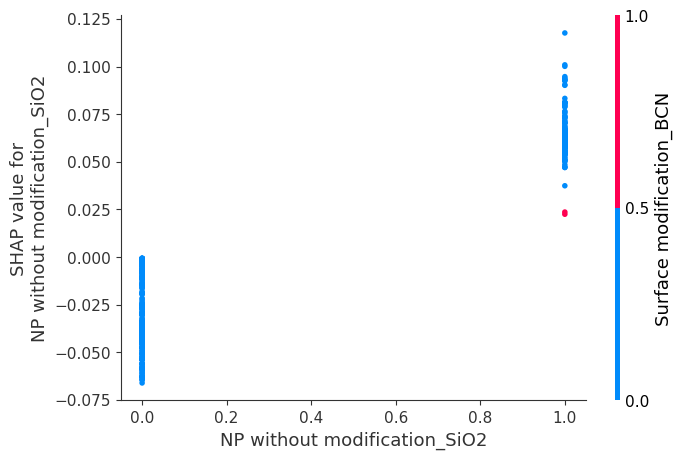

In [113]:
shap.dependence_plot("NP without modification_SiO2",dnn_shap_analysis.values[:,:,1],features=dnn_shap_analysis.data,feature_names=dnn_shap_analysis.feature_names,interaction_index="Surface modification_BCN")

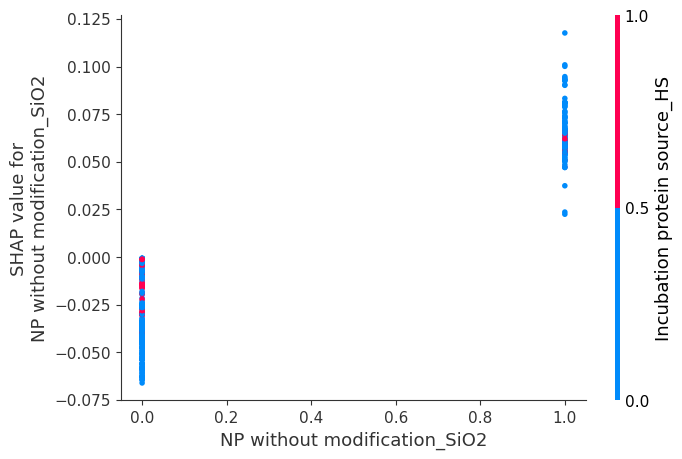

In [112]:
shap.dependence_plot("NP without modification_SiO2",dnn_shap_analysis.values[:,:,1],features=dnn_shap_analysis.data,feature_names=dnn_shap_analysis.feature_names,interaction_index="Incubation protein source_HS")

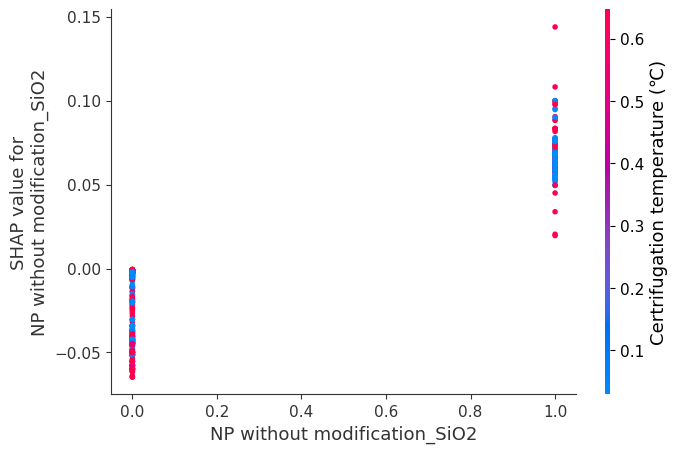

In [110]:
shap.dependence_plot("NP without modification_SiO2",dnn_shap_analysis.values[:,:,1],features=dnn_shap_analysis.data,feature_names=dnn_shap_analysis.feature_names,interaction_index="Certrifugation temperature (℃)")

In [18]:
shap.force_plot(dnn_explainer.expected_value[1],dnn_shap[:,:,1],features=train_X.iloc[:,:],feature_names=colums_name.tolist())

In [111]:
dnn_shap_2 = np.concatenate([dnn_shap[:,:13,:],np.sum(dnn_shap[:,13:53,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,53:103,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,103:108,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,108:112,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,112:118,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,118:123,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,123:126,:],axis=1).reshape(586,1,2),np.sum(dnn_shap[:,126:,:],axis=1).reshape(586,1,2)],axis = 1)

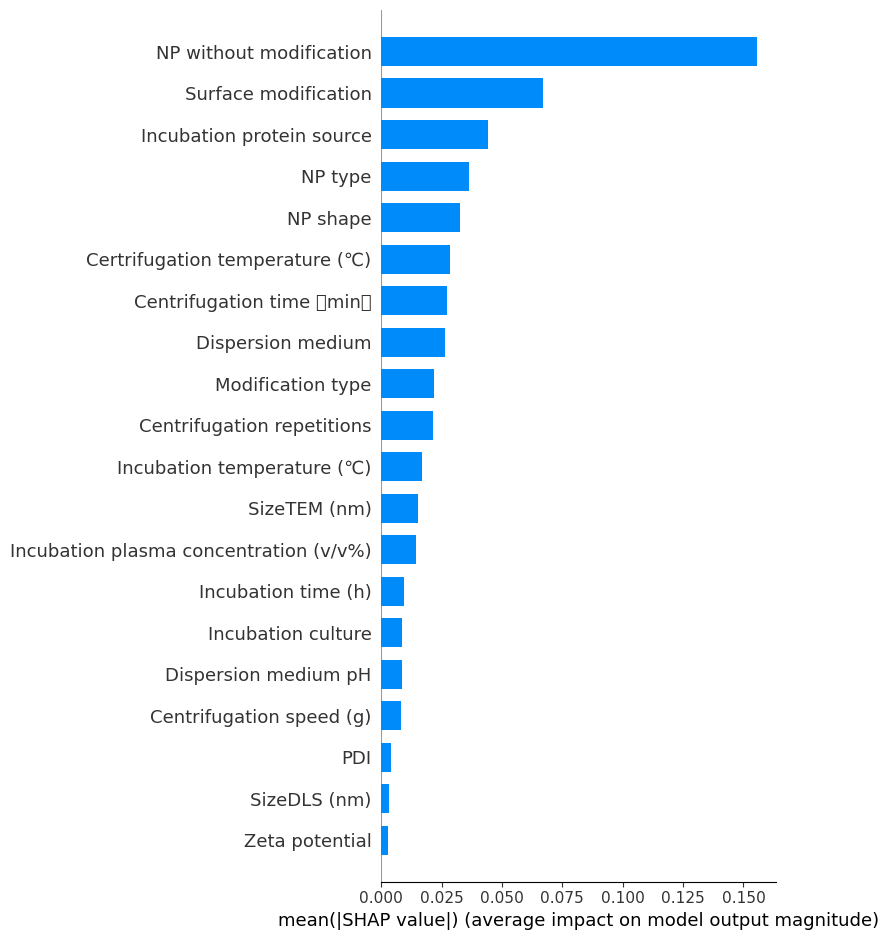

In [112]:
shap.summary_plot(dnn_shap_2[:,:,1],feature_names=col_name_without_oh.tolist(),plot_type="bar")

In [26]:
shap.dependence_plot(dnn_shap[:,:,1])

AttributeError: 'NoneType' object has no attribute 'shape'

In [283]:
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
train_y.index = [i for i in range(len(train_y))]
test_y.index = [i for i in range(len(test_y))]
train_y = pd.DataFrame(train_y)
test_y = pd.DataFrame(test_y)
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
test_X = torch.tensor(test_X).float()
train_X = torch.tensor(train_X).float()

In [259]:
train_loader = DataLoader(dataset=ProDataset(test_X,test_y),batch_size=32,shuffle=True)

In [223]:
model.eval()
loss = []
loss_func = nn.CrossEntropyLoss(reduction="mean")
for data in train_loader:
    with torch.no_grad():
        NP_Feature,target= data
        NP_Feature = Variable(NP_Feature.float())

        # Protein_Feature = Variable(Protein_Feature.cuda().float())
        target = Variable(target)
        # cos_target = Variable(cos_target.cuda())
        target = torch.squeeze(target)
        target = torch.tensor(target, dtype=torch.int64)
        # cos_target = torch.tensor(cos_target,dtype=torch.int64)
        # target_label = target.cpu().detach().numpy()
        target_label = target
        output = model(NP_Feature)
        output = output.squeeze()
        # cos_loss = cosine_loss(np_embedding,protein_embedding,cos_target)
        loss = loss_func(output,target)
        # loss = cos_loss + out_loss
        # epoch_loss += loss.cpu().detach().numpy()
#         epoch_loss += loss
#         soft = nn.Softmax(dim=1)
        # y_pred = output
#         y_pred = soft(output)
        # y_pred = y_pred.cpu().detach().numpy()
#         pred += [pred[1] for pred in y_pred]
        # pred += [pred_ for pred_ in y_pred]
#         true_ += list(target_label)
#         n += 1
    break
# epoch_loss_avg = epoch_loss/n
# return epoch_loss_avg,pred,true_

In [224]:
output

tensor([[1.2853e-01, 8.7147e-01],
        [4.8292e-01, 5.1708e-01],
        [1.3747e-03, 9.9863e-01],
        [1.0000e+00, 1.1579e-08],
        [1.0518e-07, 1.0000e+00],
        [4.1712e-20, 1.0000e+00],
        [1.7511e-10, 1.0000e+00],
        [1.0000e+00, 5.5275e-14],
        [3.7643e-20, 1.0000e+00],
        [4.3281e-20, 1.0000e+00],
        [1.6587e-15, 1.0000e+00],
        [4.2580e-08, 1.0000e+00],
        [3.0474e-07, 1.0000e+00],
        [1.9432e-23, 1.0000e+00],
        [1.9947e-09, 1.0000e+00],
        [6.6857e-04, 9.9933e-01],
        [8.5613e-13, 1.0000e+00],
        [9.9999e-01, 5.1128e-06],
        [3.5853e-01, 6.4147e-01],
        [2.2892e-18, 1.0000e+00],
        [7.6815e-06, 9.9999e-01],
        [1.5108e-14, 1.0000e+00],
        [1.0000e+00, 1.2880e-13],
        [2.9706e-01, 7.0294e-01],
        [3.5429e-07, 1.0000e+00],
        [9.6965e-01, 3.0351e-02],
        [8.4807e-04, 9.9915e-01],
        [1.3950e-03, 9.9861e-01],
        [9.0265e-01, 9.7353e-02],
        [2.802

In [133]:
background = train_X[np.random.choice(train_X.shape[0], 100, replace=False)]

In [275]:
model.eval()
dnn_explainer = shap.DeepExplainer(model,test_X)

In [239]:
test_X[0]

tensor([4.2244e-02, 2.0898e-01, 2.1053e-01, 2.5832e-04, 0.0000e+00, 0.0000e+00,
        6.4706e-01, 8.0000e-01, 4.8342e-02, 2.3961e-02, 5.9524e-03, 4.5455e-01,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+

In [284]:
dnn_shap = dnn_explainer.shap_values(train_X,check_additivity=False)

In [285]:
shap.force_plot(dnn_explainer.expected_value[1],dnn_shap[:,:,1])

In [260]:
model.eval()
for data in train_loader:
    NP_Feature,target= data
    NP_Feature = Variable(NP_Feature.float())

    # Protein_Feature = Variable(Protein_Feature.cuda().float())
    target = Variable(target)
    # cos_target = Variable(cos_target.cuda())
    target = torch.squeeze(target)
    target = torch.tensor(target, dtype=torch.int64)
    # cos_target = torch.tensor(cos_target,dtype=torch.int64)
    # target_label = target.cpu().detach().numpy()
    target_label = target
    dnn_explainer = shap.DeepExplainer(model,NP_Feature)
    dnn_shap = dnn_explainer.shap_values(NP_Feature,check_additivity=False)
#             output = model(NP_Feature)
#             output = output.squeeze()
    # cos_loss = cosine_loss(np_embedding,protein_embedding,cos_target)
    loss = loss_func(output,target)
    # loss = cos_loss + out_loss
    # epoch_loss += loss.cpu().detach().numpy()
    epoch_loss += loss
    soft = nn.Softmax(dim=1)
    # y_pred = output
    y_pred = soft(output)
    # y_pred = y_pred.cpu().detach().numpy()
    pred += [pred[1] for pred in y_pred]
    break
            # pred += [pred_ for pred_ in y_pred]


TypeError: 'builtin_function_or_method' object is not subscriptable

In [229]:
dnn_shap.shape

(32, 129, 2)

In [135]:
train_X = train_X.numpy()
train_X = pd.DataFrame(train_X)

In [147]:
dnn_shap = dnn_explainer.shap_values(train_X[:100]) 

AssertionError: The SHAP explanations do not sum up to the model's output! This is either because of a rounding error or because an operator in your computation graph was not fully supported. If the sum difference of %f is significant compared to the scale of your model outputs, please post as a github issue, with a reproducible example so we can debug it. Used framework: pytorch - Max. diff: 0.4366041835855867 - Tolerance: 0.01

In [5]:
pip install tensorflow-cpu==2.13.0

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     -------------------------------------- 276.5/276.5 MB 4.2 MB/s eta 0:00:00
     ---------------------------------------- 14.9/14.9 MB 6.0 MB/s eta 0:00:00
     ---------------------------------------- 5.6/5.6 MB 6.0 MB/s eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 5.2 MB/s eta 0:00:00
     -------------------------------------- 440.8/440.8 kB 3.9 MB/s eta 0:00:00
  Using cached https://pypi.tuna.tsinghua.edu.cn/packages/a2/ad/e0d3c824784ff121c03cc031f944bc7e139a8f1870ffd2845cc2dd76f6c4/absl_py-2.1.0-py3-none-any.whl (133 kB)
     -------------------------------------- 413.4/413.4 kB 3.7 MB/s eta 0:00:00
  Using cached https://pypi.tuna.tsinghua.edu.cn/packages/7a/13/e503968fefabd4c6b2650af21e110aa8466fe21432cd7c43a84577a89438/tensorboard_data_server-0.7.2-py3-none-any.whl (2.4 kB)
  Using cached https://pypi.tuna.tsinghua.edu.cn/packages/92/94/35ba55b5011185ea1c995938e7851b25e6092f15658afa9263cd6

ERROR: Could not install packages due to an OSError: [WinError 5] 拒绝访问。: 'C:\\Users\\admin\\anaconda3\\Lib\\site-packages\\google\\~-otobuf\\internal\\_api_implementation.cp39-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



TypeError: Descriptors cannot be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

In [48]:
pip install captum

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ---------------------------------------- 1.3/1.3 MB 1.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [64]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
from torch.autograd import Variable
class DNN_cm(nn.Module):
    def __init__(self,input_size,hidden_size,output_size):
        super(DNN_cm, self).__init__()
        self.linner1 = nn.Linear(input_size,hidden_size)
        self.linner2 = nn.Linear(hidden_size,hidden_size)
        self.linner3 = nn.Linear(hidden_size,output_size)
        self.dropout = nn.Dropout(0.5)
        self.act_fun1 = nn.ReLU()
        self.norm = nn.BatchNorm1d(input_size)
        self.optimizer = torch.optim.Adam(self.parameters())
        self.sigmoid = nn.Softmax(dim = 1)
    def forward(self,X_in):
        X = self.norm(X_in)
        X = self.linner1(X)
        X = self.dropout(X)
        X = self.act_fun1(X)
        X = self.linner2(X)
        X = self.dropout(X)
        X = self.act_fun1(X)
        X = self.linner3(X)
        X_out = self.sigmoid(X)
#         X_out = X_out.unsqueeze(-1)
        return X_out

In [46]:
Full_Model = DNN(129,256,2)
    # model = joblib.load("./ERT_Model/"+p_id+"_ERT_best.pkl")
Full_Model.load_state_dict(torch.load("./DNN_OS_50_final_Model/P02766_DNN_best.pkl"))

<All keys matched successfully>

In [47]:
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
train_y.index = [i for i in range(len(train_y))]
test_y.index = [i for i in range(len(test_y))]
# train_y = pd.DataFrame(train_y)
test_y = pd.DataFrame(test_y)
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
# train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
# test_X = torch.tensor(test_X).float()
train_X = torch.tensor(train_X).float()
train_y = torch.tensor(train_y,dtype = torch.int64)

In [48]:
import matplotlib.pyplot as plt 
import captum.attr as attr 
Full_Model.eval()
# 创建你的神经网络模型和输入数据 model = ... input_data = ... # 选择解释方法（例如 Integrated Gradients）
explainer = attr.FeatureAblation(Full_Model) #
# baselines = torch.zeros_like(train_X)
# explainer_shap = shap.DeepExplainer(Full_Model,train_X)
# shap_explanation = shap.Explanation(None, base_values=None, data=train_X, values=shap_values)
# dnn_shap,a = explainer_shap.shap_values(train_X)
# train_X = train_X.numpy()
# dnn_shap_analysis = shap.Explanation(values=dnn_shap,data = train_X,feature_names=colums_name.tolist())
attributions = explainer.attribute(train_X,target=train_y) # 可视化解释结果

# 可视化特征重要性
# shap.force_plot(explainer.baselines,attributions)

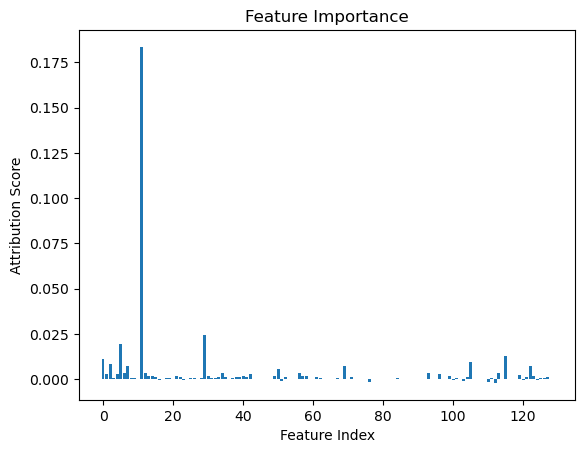

In [54]:
feature_importace = attributions.mean(0)
plt.bar(range(len(feature_importace)), feature_importace)
plt.xlabel('Feature Index')
plt.ylabel('Attribution Score')
plt.title('Feature Importance')
plt.show()

In [55]:
feature_importace

tensor([ 1.1000e-02,  3.1283e-03,  8.5922e-03,  8.6077e-04,  2.6591e-03,
         1.9577e-02,  3.7056e-03,  7.2034e-03,  5.4263e-04,  8.3989e-04,
         1.1017e-04,  1.8354e-01,  3.5991e-03,  1.6948e-03,  1.6821e-03,
         1.0136e-03, -1.2489e-04,  3.4632e-04,  4.5761e-04,  7.4533e-04,
         1.6120e-04,  1.5600e-03,  1.2701e-03, -1.7746e-04,  3.8205e-04,
         4.3780e-04,  6.7424e-04,  9.2812e-05,  6.9871e-04,  2.4682e-02,
         1.6376e-03,  4.8710e-04,  8.2923e-04,  1.2126e-03,  3.5855e-03,
         1.4985e-03,  9.0031e-05,  6.6838e-04,  1.3399e-03,  1.1135e-03,
         1.6270e-03,  1.5047e-03,  2.9003e-03,  1.1419e-05,  3.9406e-04,
         8.9634e-05,  2.0628e-07,  1.4484e-07,  8.3029e-05,  1.8136e-03,
         5.6199e-03, -8.4426e-04,  1.0337e-03,  6.5128e-07,  3.6485e-07,
        -2.4903e-06,  3.4108e-03,  1.5597e-03,  1.5736e-03,  4.9708e-07,
         0.0000e+00,  1.2927e-03,  8.8261e-04,  2.6425e-07,  0.0000e+00,
        -1.3128e-06,  4.5059e-07,  7.8854e-04,  3.1

In [11]:
import networkx as nx
shap_values_array = attributions
shap_values_array = shap_values_array.numpy()
data_shap = train_X.numpy()

In [12]:
shap_explanation = shap.Explanation(values=shap_values_array,data=data_shap,feature_names=colums_name.tolist())

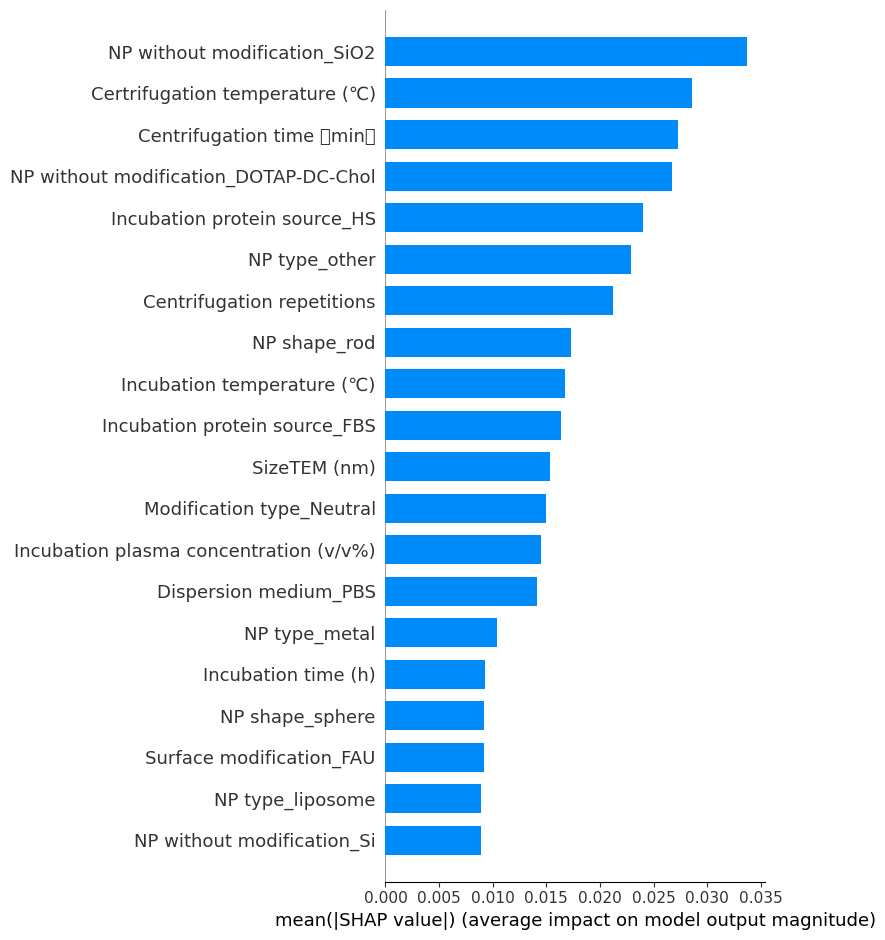

In [18]:
shap.summary_plot(dnn_shap_analysis.values[:,:,1],feature_names=colums_name.tolist(),plot_type="bar")

In [14]:
# attributions = attributions.detach().numpy()
shap.force_plot(explainer_shap.expected_value[0],shap_explanation.values,features=shap_explanation.data,feature_names=shap_explanation.feature_names)

In [2]:
from pdpbox import info_plots,pdp,get_dataset

In [14]:
from pdpbox import info_plots
import matplotlib.pyplot as plt

In [36]:
import joblib
train_data = pd.read_csv("./Protein_data/P02766_Train_data.csv",index_col=0)
test_data = pd.read_csv("./Protein_data/P02766_Test_data.csv",index_col=0)
del train_data["Title"]
del test_data["Title"]
train_X = train_data.iloc[:,:-1]
train_y = train_data.iloc[:,-1]
test_X = test_data.iloc[:,:-1]
test_y = test_data.iloc[:,-1]
scaler = MinMaxScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X)
train_X = pd.DataFrame(train_X)
test_X = scaler.transform(test_X)
test_X = pd.DataFrame(test_X)
test_X.columns = colums_name.to_list()
# test_X = torch.tensor(test_X).float()
model = joblib.load("./ERT_OS_final_Model/P02766_ERT_best.pkl")

In [37]:
pdpios = pdp.pdp_isolate(model,test_X,model_features=colums_name.tolist(),feature=colums_name[13:53].tolist())#回归可以用

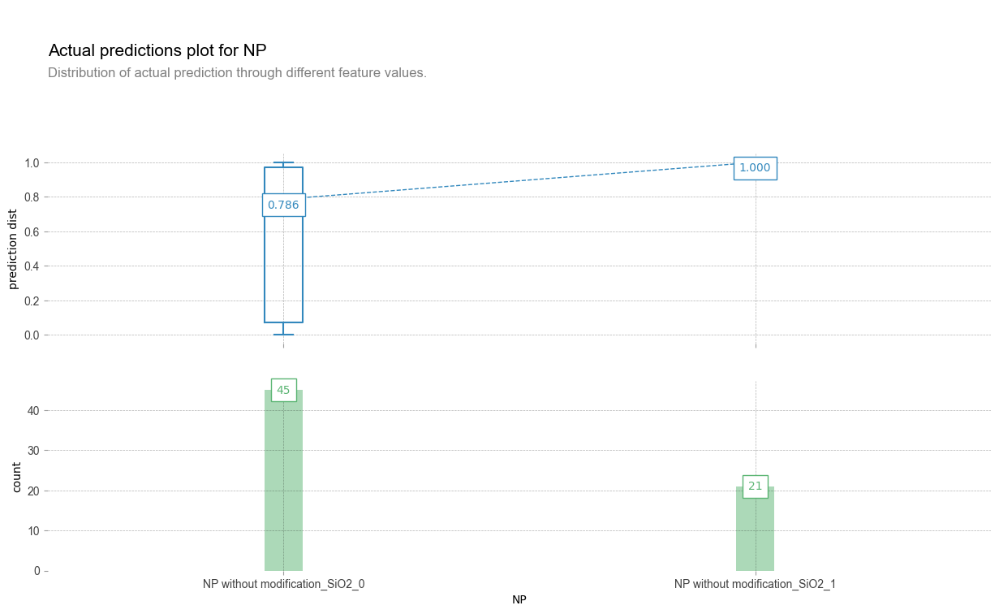

In [17]:
fig,axes,summary_df = info_plots.actual_plot(model,test_X,feature="NP without modification_SiO2",feature_name="NP",predict_kwds={})

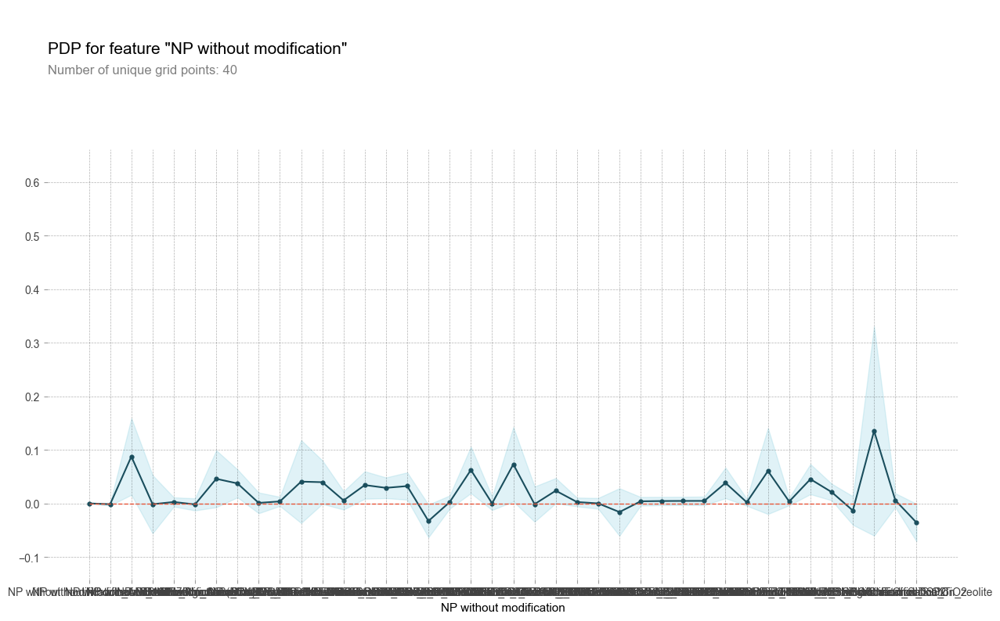

In [38]:
pdp.pdp_plot(pdpios, "NP without modification")
plt.show()

In [35]:
?pdp.PDPIsolatePlotEngine

In [199]:
ALL_data = pd.read_excel("pnas.1919755117.sd01.xlsx")

In [189]:
ips = list(ALL_data.iloc[:,126:].columns)
a=[]
for i in range(3):
    a.append(0)

In [145]:
one_hot_encoding = {}

In [190]:
for i in range(3):
    s = ips[i]
#     print(s)
    code = a.copy()
    code[i] = 1
    one_hot_encoding.setdefault(s,code)

In [194]:
import joblib
joblib.dump(one_hot_encoding,"Encoding.pkl")

['Encoding.pkl']

In [202]:
def transform_one_hot(dataframe,name):
    encode_dict = joblib.load("Encoding.pkl")
    data = []
    for i in range(len(dataframe)):
        s = name + "_" + dataframe[i]
        data.append(encode_dict[s])
    data = pd.DataFrame(data)
    return data
a = transform_one_hot(ALL_data["NP without modification"],"NP without modification")

In [205]:
ALL_data[["NP without modification", "Surface modification", "Incubation protein source", "NP type", "NP shape",
     "Dispersion medium", "Incubation culture", "Modification type"]]

,NP without modification,Surface modification,Incubation protein source,NP type,NP shape,Dispersion medium,Incubation culture,Modification type
0,PS,PEG,HP,other,sphere,water,water,Neutral
1,PS,PEG,HP,other,sphere,water,water,Neutral
2,PS,NH2,HP,other,sphere,water,water,Anionic
3,PS,PEEP,HP,other,sphere,water,water,Neutral
4,PS,PEEP,HP,other,sphere,water,water,Neutral
...,...,...,...,...,...,...,...,...
647,Au,none,RP,metal,rod,water,water,Neutral
648,Au,none,RP,metal,star,water,water,Neutral
649,Au,none,RP,metal,star,plasma,water,Neutral
650,Au,none,RP,metal,star,water,water,Neutral


In [ ]:
en